In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.optimizers import *
from tensorflow.keras import datasets

In [2]:
!kaggle datasets download jessicali9530/celeba-dataset

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100% 1.33G/1.33G [00:11<00:00, 258MB/s]
100% 1.33G/1.33G [00:11<00:00, 125MB/s]


In [3]:
!unzip /content/celeba-dataset.zip -d /content/celeba-dataset

Streaming output truncated to the last 5000 lines.
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197604.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: /content/celeba-dataset/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: /content/cel

In [20]:
BATCH_SIZE = 32
IMG_SHAPE = (64, 64, 3)
LEARNING_RATE = 2e-4
LATENT_DIM = 100
EPOCHS=15
train_dir = "/content/celeba-dataset/img_align_celeba/img_align_celeba"

In [5]:
dataset_train = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,label_mode=None, image_size = (64,64), batch_size = BATCH_SIZE
)

Found 202599 files.


In [6]:
dataset_train

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

In [7]:
def preprocess(image):
  return tf.cast(image, tf.float32) / 127.5 - 1.0

In [8]:
train_dataset = (
    dataset_train.map(preprocess).unbatch().shuffle(buffer_size=1024, reshuffle_each_iteration=True).batch(BATCH_SIZE, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
)

In [9]:
for d in train_dataset.take(1):
  print(d.shape)
  break

(32, 64, 64, 3)


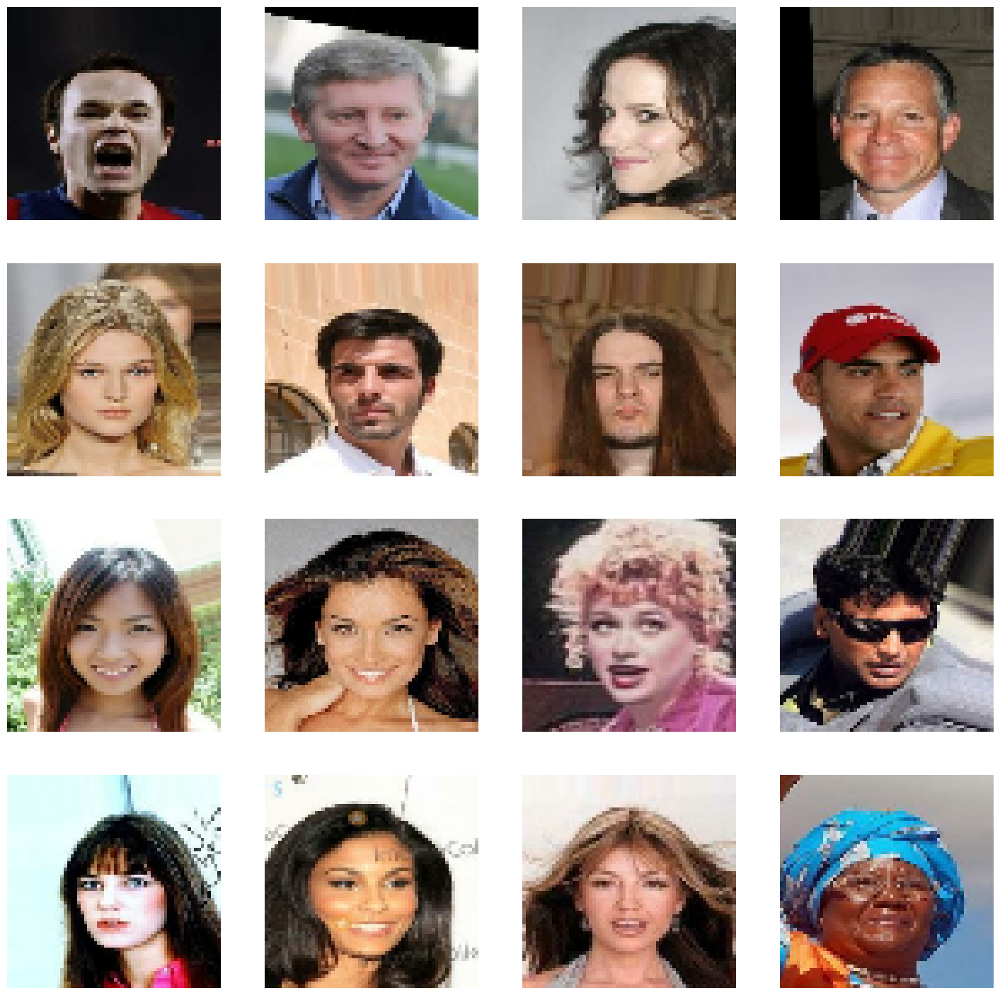

In [10]:
plt.figure(figsize=(18,18))
k=0
n=16
for i in range(n):
  ax = plt.subplot(4,4,k+1)
  plt.imshow((d[i]+1)/2)
  plt.axis("off")
  k+=1

In [11]:
generator = tf.keras.Sequential([
    Input(shape=(LATENT_DIM,)),
    Dense(4*4*LATENT_DIM),
    Reshape((4,4,LATENT_DIM)),
    Conv2DTranspose(512, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2DTranspose(256, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(),

    Conv2DTranspose(128, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(),

    Conv2DTranspose(3, (4,4), strides=(2,2), padding="same", activation="tanh"),
], name="generator")

generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 1600)                │         161,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 100)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 512)           │         819,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           6,147 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,612,867 (13.78 MB)

 Trainable params: 3,611,075 (13.78 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [12]:
discriminator = tf.keras.Sequential([
    Input(shape=(IMG_SHAPE[0],IMG_SHAPE[1],3)),

    Conv2D(64, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2D(128, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2D(256, (4,4), strides=(2,2), padding="same"),
    BatchNormalization(),
    LeakyReLU(0.2),

    Conv2D(1, (4,4), strides=(2,2), padding="same"),

    Flatten(),
    Dense(1, activation="sigmoid")
], name="discriminator")

discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 4, 4, 1)             │           4,097 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 664,786 (2.54 MB)

 Trainable params: 663,890 (2.53 MB)

 Non-trainable params: 896 (3.50 KB)

In [13]:
class GAN(tf.keras.Model):
  def __init__(self, discriminator, generator):
    super(GAN, self).__init__()
    self.discriminator = discriminator
    self.generator = generator

  def compile(self, d_optimizer, g_optimizer, loss_fn):
    super(GAN, self).compile()
    self.d_optimizer = d_optimizer
    self.g_optimizer = g_optimizer
    self.loss_fn = loss_fn
    self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")
    self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

  @property
  def metrics(self):
    return [self.d_loss_metric, self.g_loss_metric]

  def train_step(self, real_images):
    BATCH_SIZE = tf.shape(real_images)[0]
    ####################################DISCRIMINATOR#######################################################
    noise = tf.random.normal(shape=(BATCH_SIZE, LATENT_DIM))
    fake_images = self.generator(noise)
    real_labels = tf.ones((BATCH_SIZE, 1)) + 0.25 * tf.random.uniform(minval=-1, maxval=1, shape=(BATCH_SIZE, 1))
    fake_labels = tf.zeros((BATCH_SIZE, 1)) + 0.25 * tf.random.uniform(shape=(BATCH_SIZE, 1))

    with tf.GradientTape() as recorder:
      real_predictions = self.discriminator(real_images)
      d_loss_real = self.loss_fn(real_labels, real_predictions)

      fake_predictions = self.discriminator(fake_images)
      d_loss_fake = self.loss_fn(fake_labels, fake_predictions)

      d_loss = d_loss_real + d_loss_fake

    partial_derivatives = recorder.gradient(d_loss, self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(partial_derivatives, self.discriminator.trainable_weights))

    ##################################GENERATOR###########################################
    noise = tf.random.normal(shape=(BATCH_SIZE, LATENT_DIM))
    flipped_fake_labels = tf.ones((BATCH_SIZE, 1))

    with tf.GradientTape() as recorder:

      fake_predictions = self.discriminator(self.generator(noise))
      g_loss = self.loss_fn(flipped_fake_labels, fake_predictions)

    partial_derivatives = recorder.gradient(g_loss, self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(partial_derivatives, self.generator.trainable_weights))

    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)

    return {'g_loss': self.g_loss_metric.result(),
            'd_loss': self.d_loss_metric.result()}

In [14]:
gan = GAN(discriminator, generator)
gan.compile(
    d_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    g_optimizer=Adam(learning_rate=LEARNING_RATE, beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy())

In [15]:
class ShowImage(tf.keras.callbacks.Callback):
  def __init__(self, latent_dim, num_img=16):
    self.latent_dim = latent_dim

  def on_epoch_end(self, epoch, logs=None):
    n=6
    k=0
    out=self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
    plt.figure(figsize=(18,18))
    for i in range(n):
      for j in range(n):
        ax = plt.subplot(n,n,k+1)
        plt.imshow((out[k]+1)/2)
        plt.axis("off")
        k+=1
    plt.savefig(f"generated/gen_images_epoch_{epoch}.png")
    plt.show()

In [16]:
!mkdir generated

Epoch 1/15
   6331/Unknown 301s 47ms/step - d_loss: 1.1443 - g_loss: 0.9365

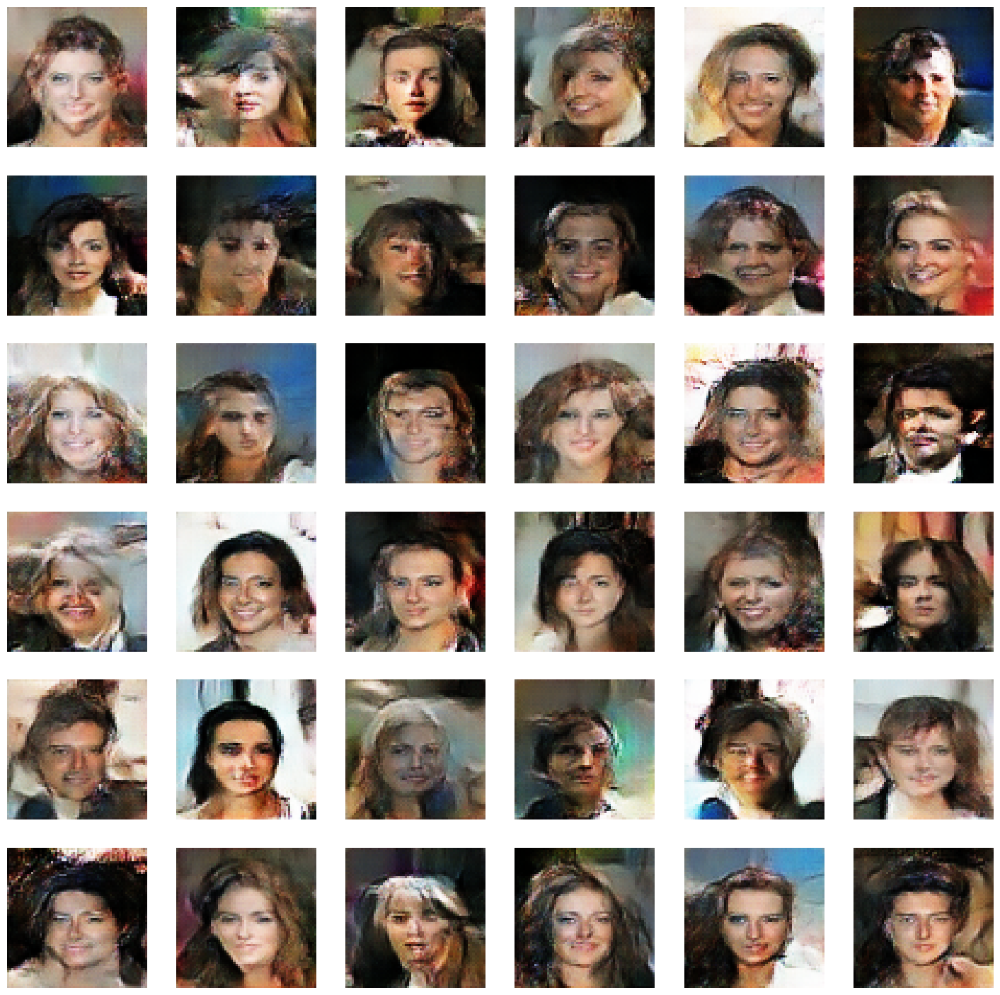

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 302s 48ms/step - d_loss: 1.1443 - g_loss: 0.9365
Epoch 2/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 1.1201 - g_loss: 0.9654

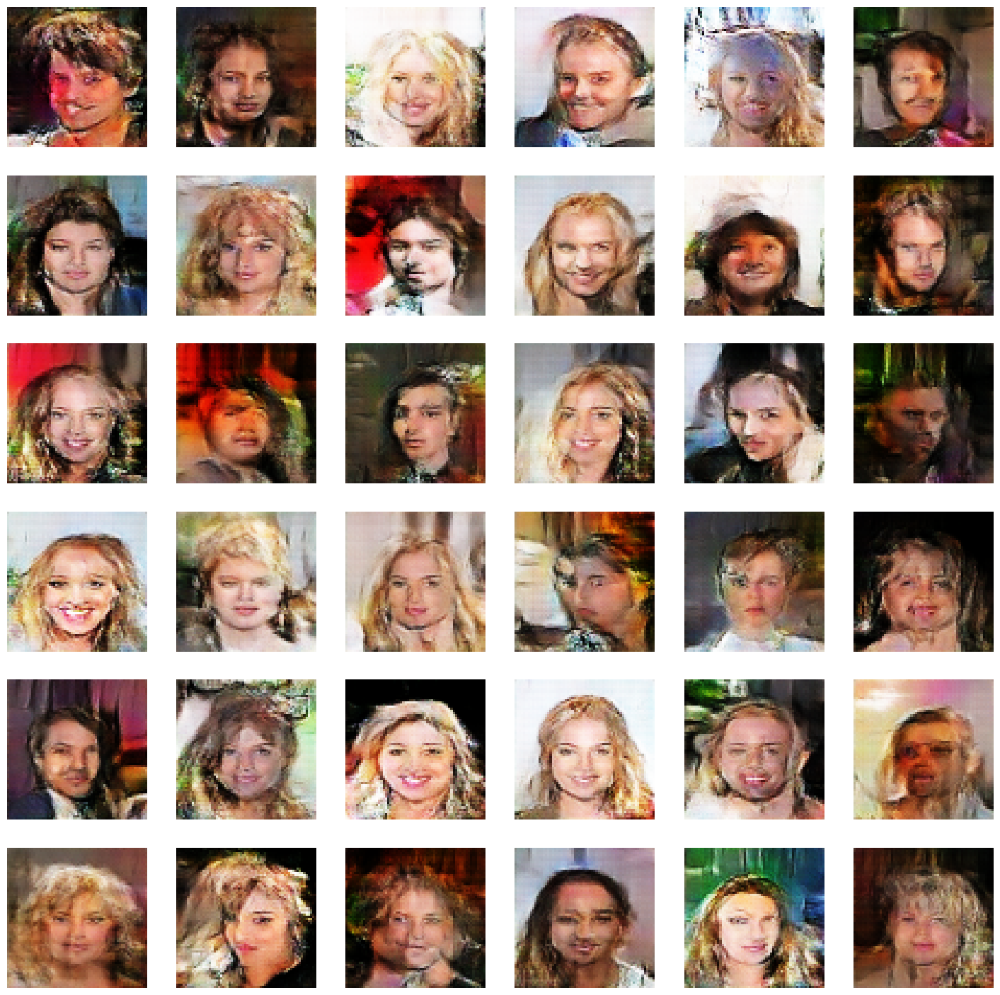

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 305s 48ms/step - d_loss: 1.1201 - g_loss: 0.9654
Epoch 3/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 1.0628 - g_loss: 1.0569

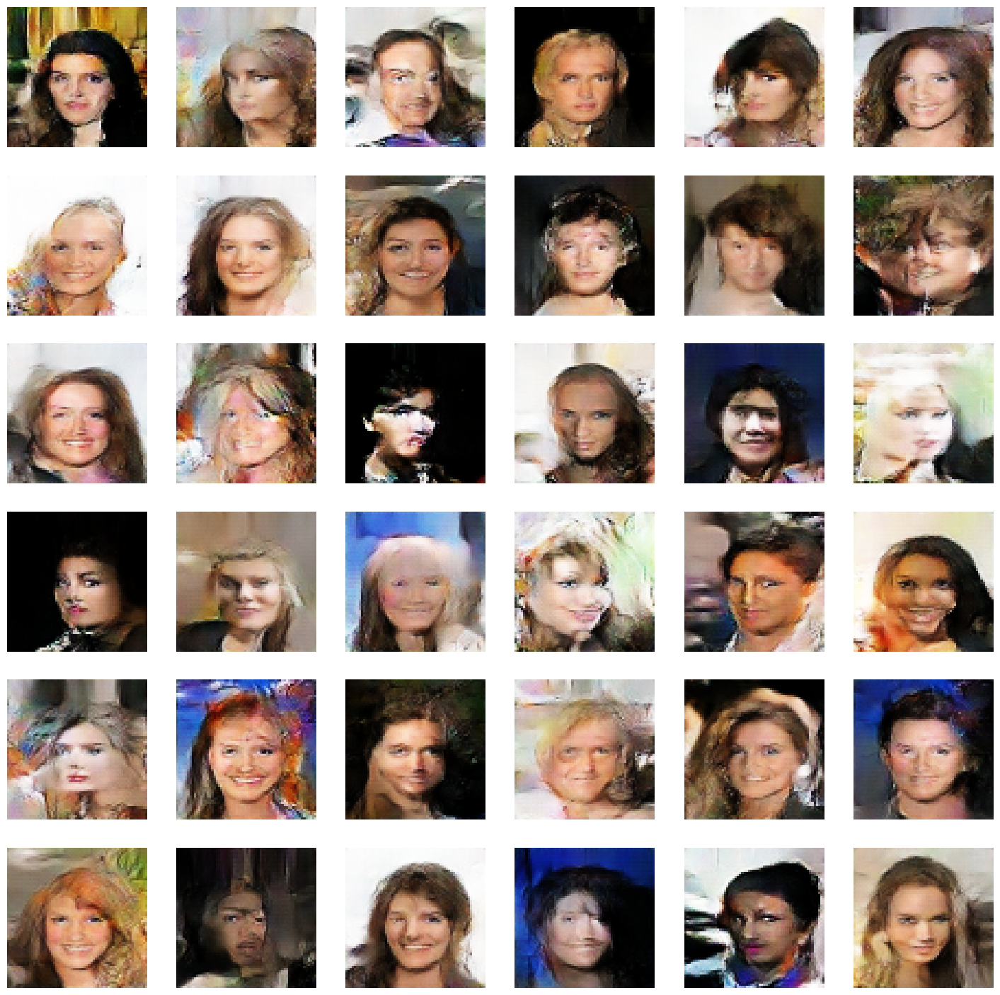

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 305s 48ms/step - d_loss: 1.0628 - g_loss: 1.0569
Epoch 4/15
6330/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 1.0140 - g_loss: 1.1231

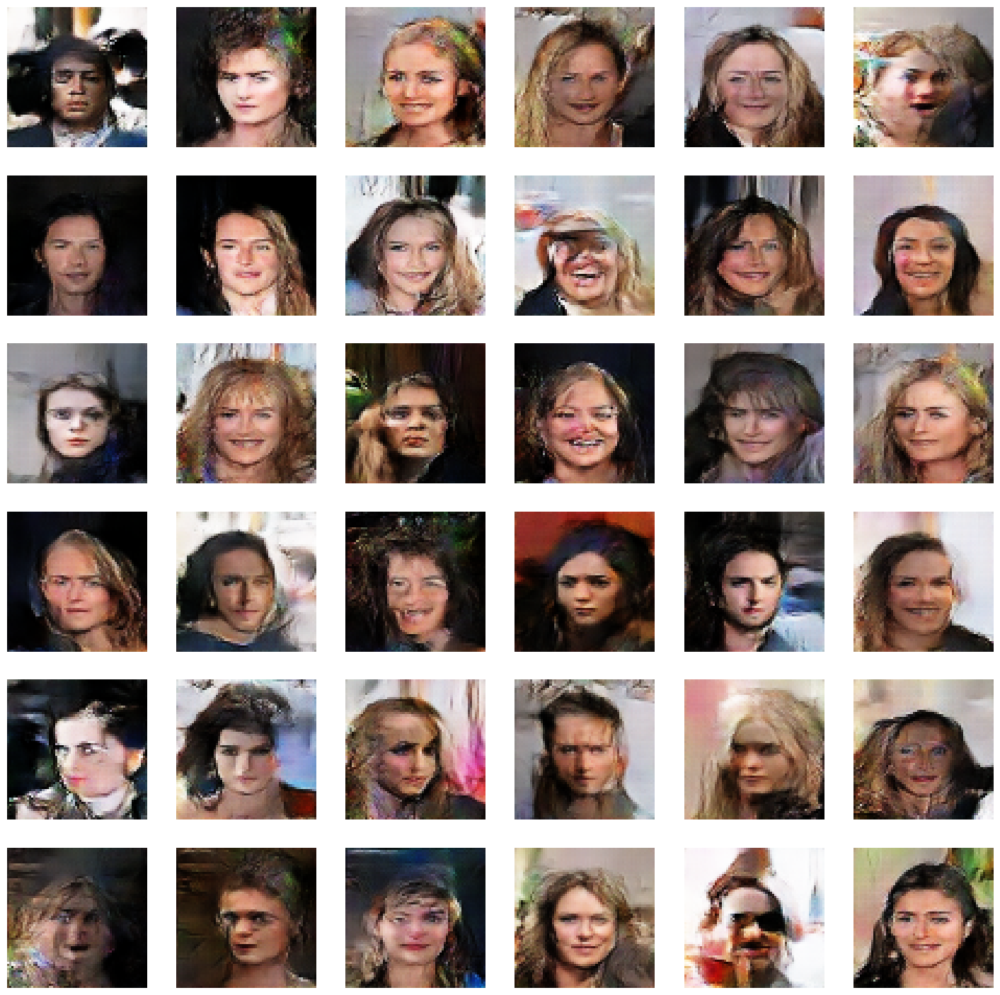

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 305s 48ms/step - d_loss: 1.0140 - g_loss: 1.1231
Epoch 5/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 1.0078 - g_loss: 1.1461

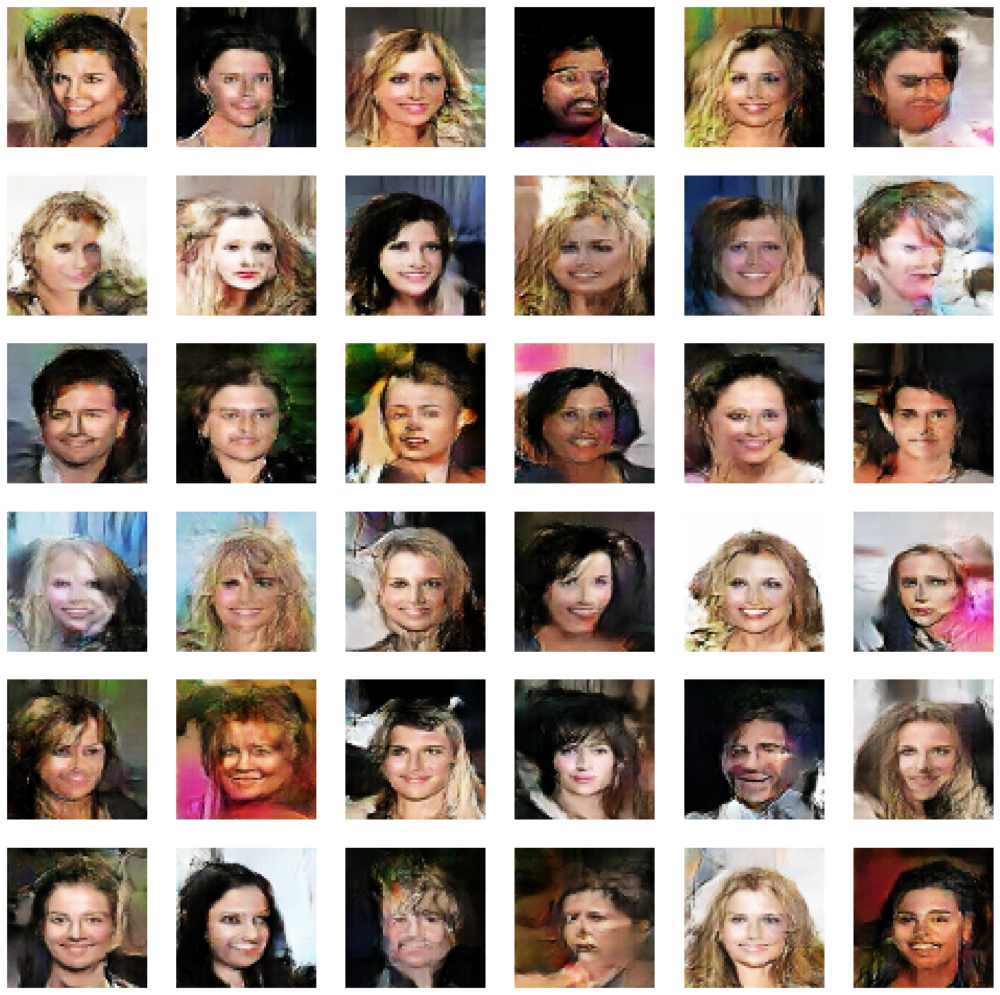

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 323s 48ms/step - d_loss: 1.0078 - g_loss: 1.1461
Epoch 6/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 0.9822 - g_loss: 1.1774

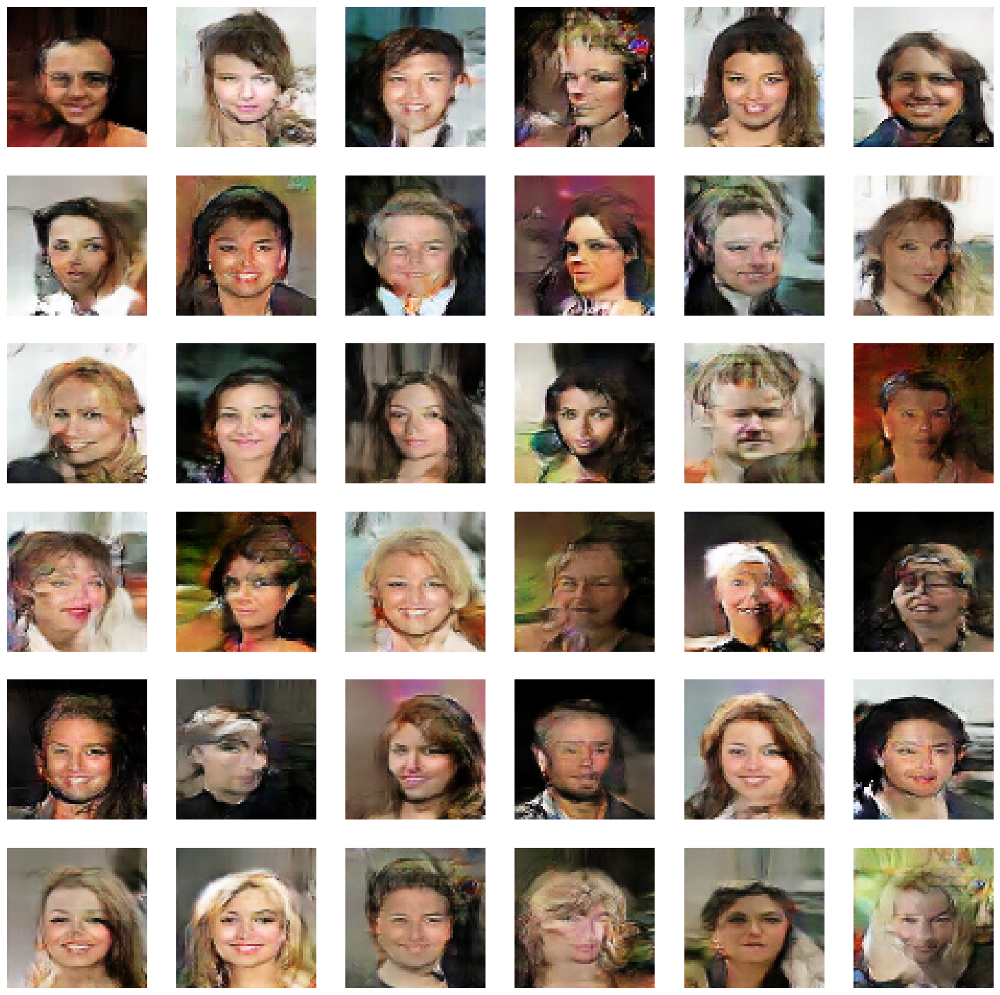

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 308s 49ms/step - d_loss: 0.9822 - g_loss: 1.1774
Epoch 7/15
6330/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 0.9811 - g_loss: 1.1954

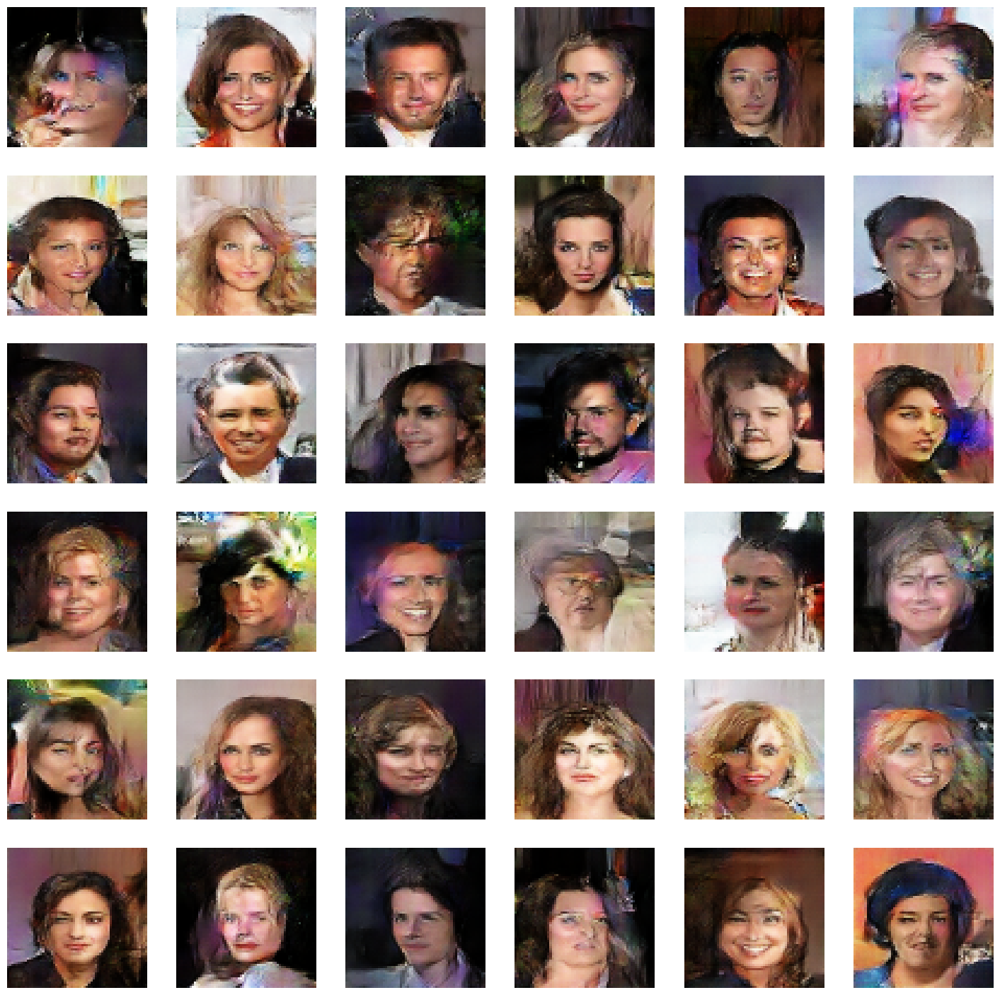

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 321s 49ms/step - d_loss: 0.9811 - g_loss: 1.1954
Epoch 8/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.9517 - g_loss: 1.2596

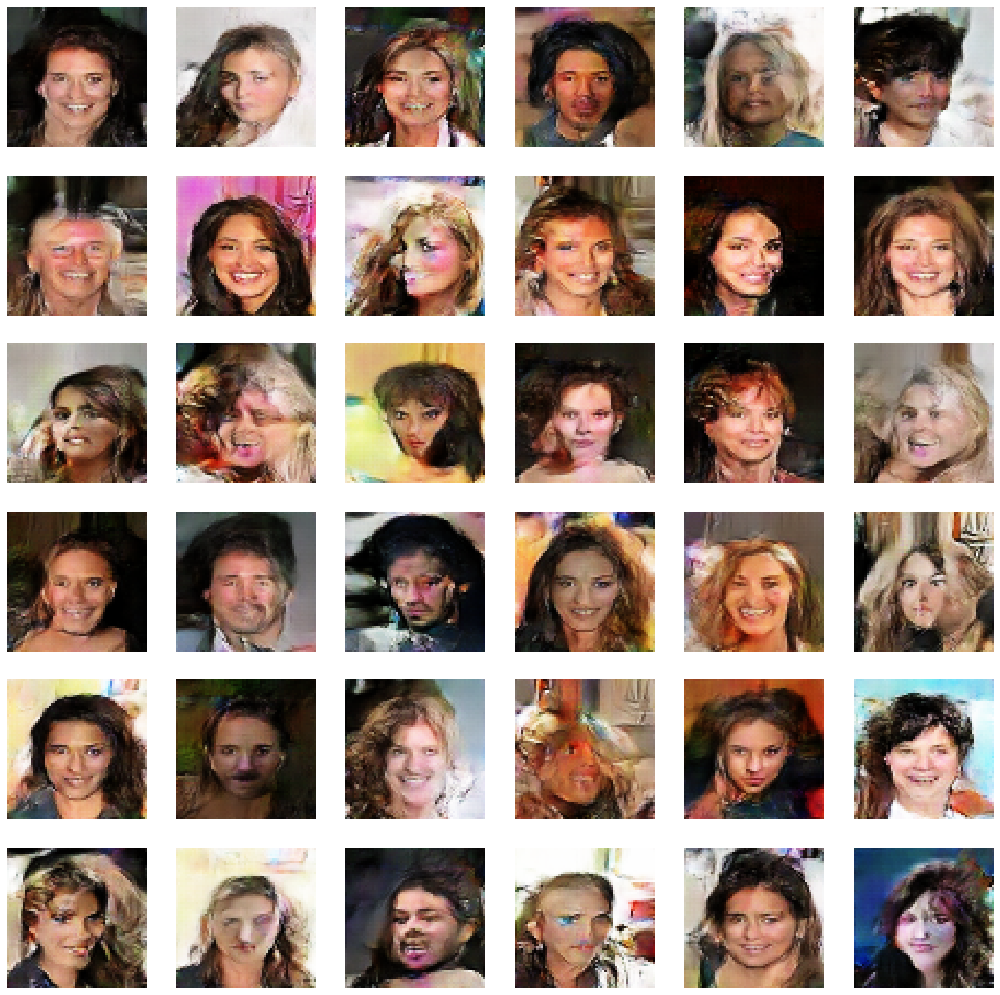

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 308s 49ms/step - d_loss: 0.9517 - g_loss: 1.2596
Epoch 9/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 0.9206 - g_loss: 1.3249

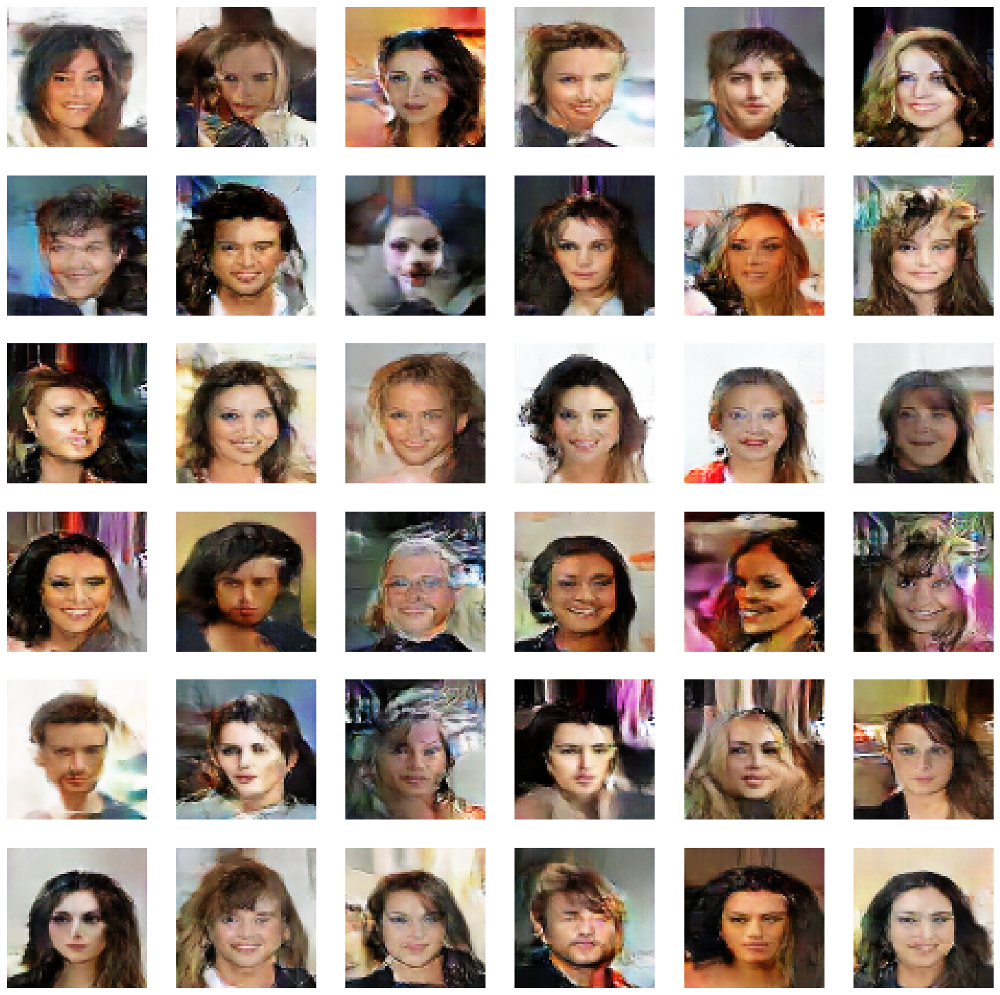

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 309s 49ms/step - d_loss: 0.9206 - g_loss: 1.3249
Epoch 10/15
6330/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.8892 - g_loss: 1.3735

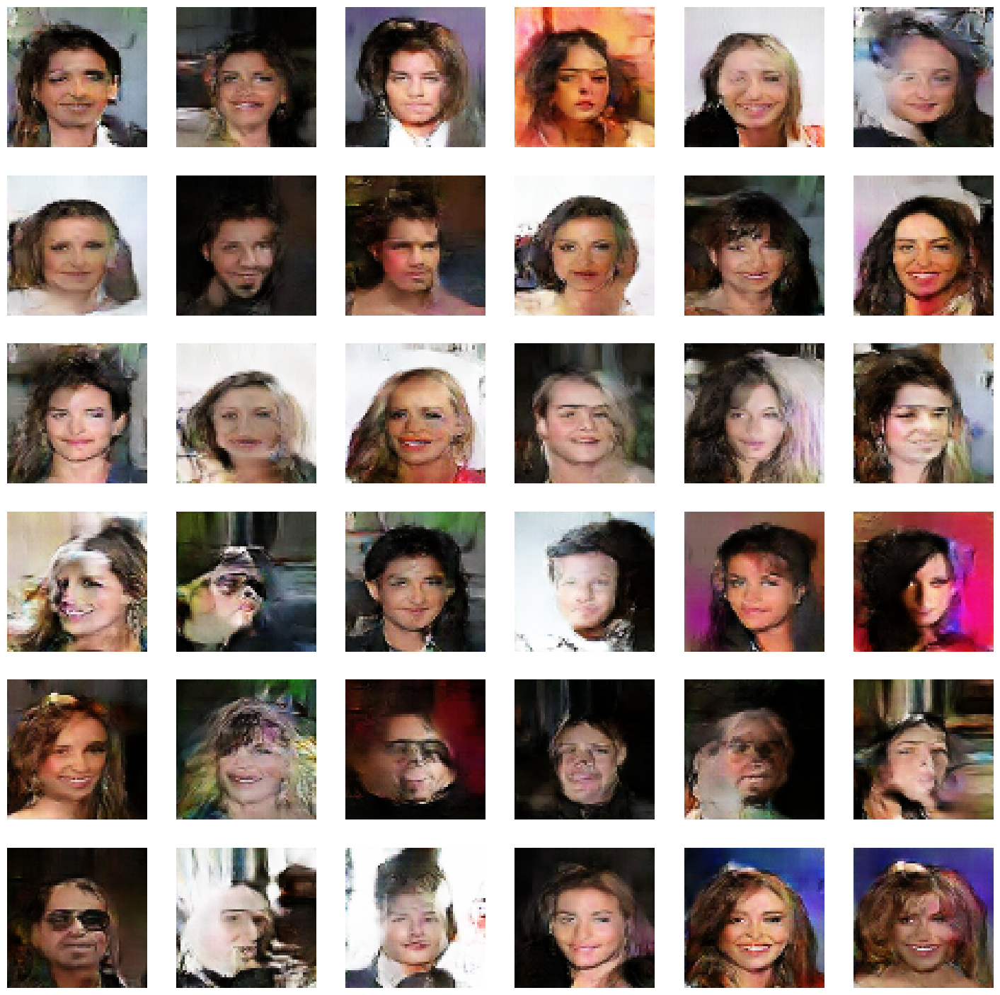

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 309s 49ms/step - d_loss: 0.8892 - g_loss: 1.3735
Epoch 11/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.8761 - g_loss: 1.4189

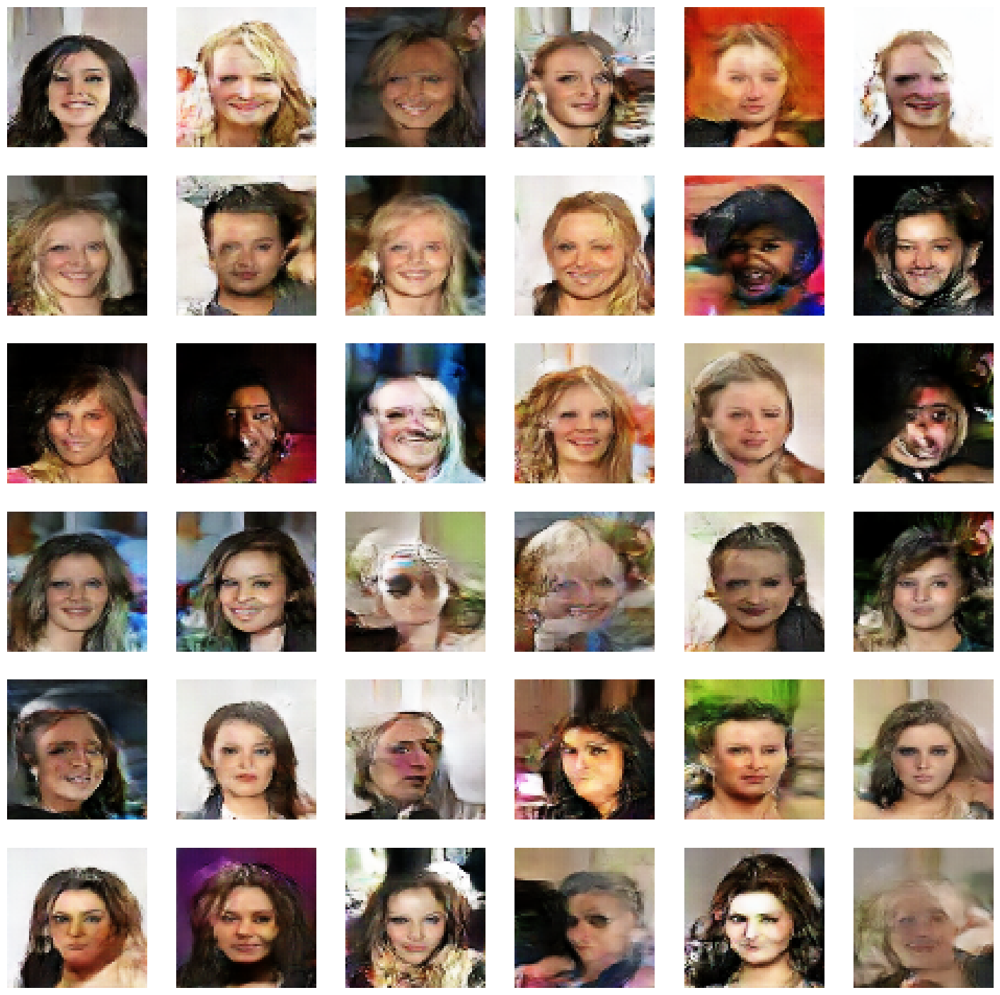

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 323s 49ms/step - d_loss: 0.8761 - g_loss: 1.4189
Epoch 12/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.8636 - g_loss: 1.4455

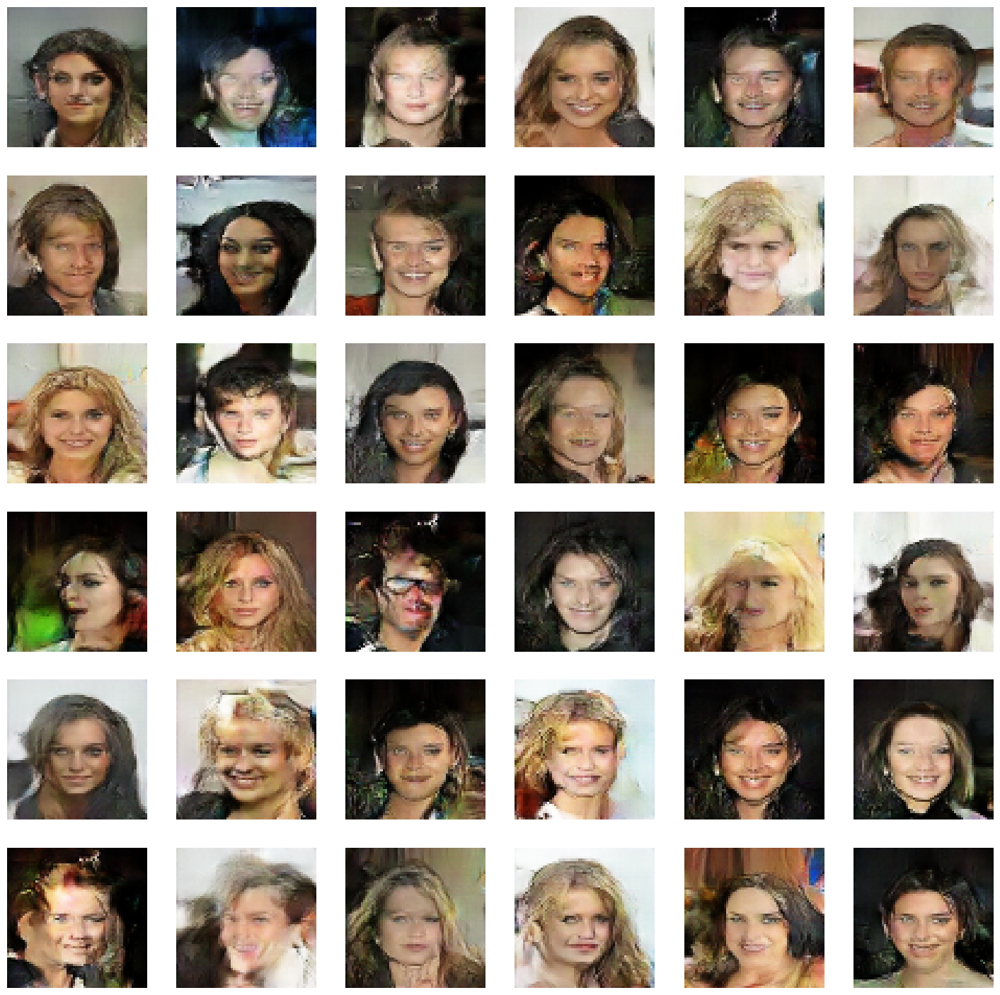

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 322s 49ms/step - d_loss: 0.8636 - g_loss: 1.4455
Epoch 13/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.8314 - g_loss: 1.5113

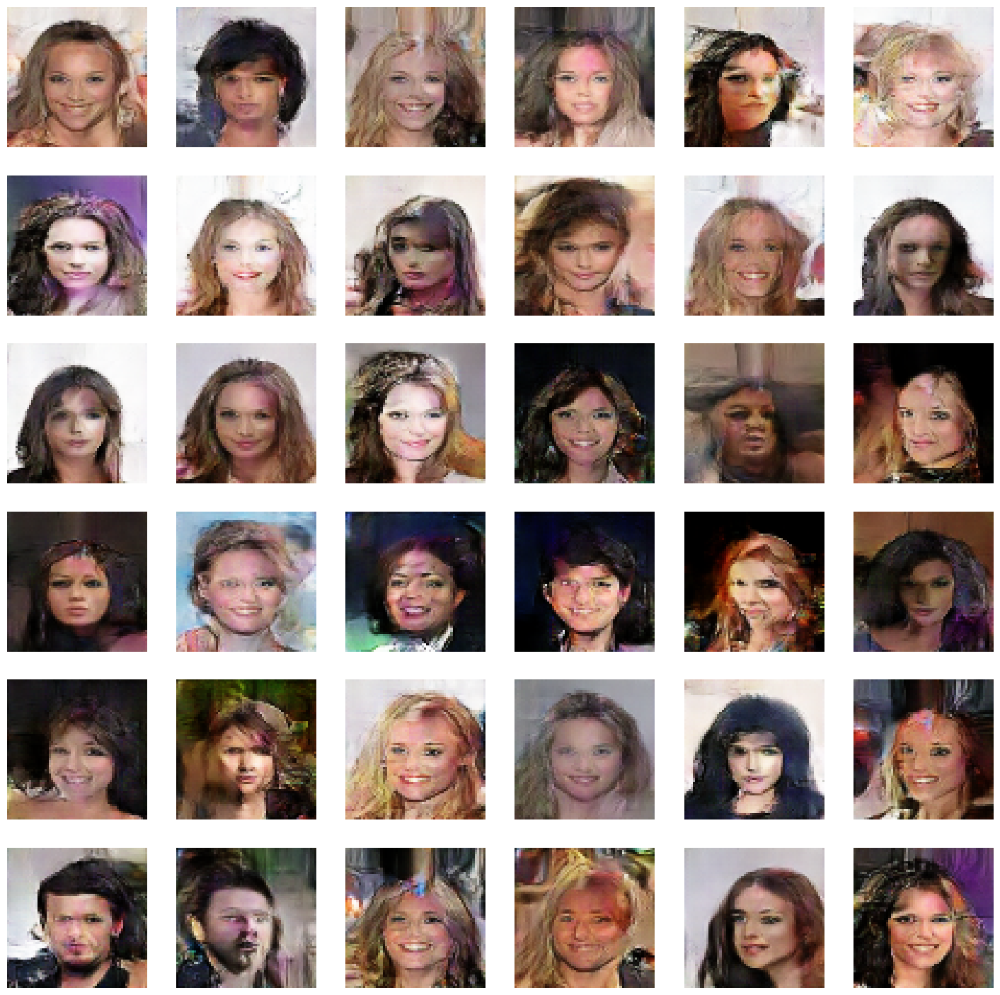

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 321s 49ms/step - d_loss: 0.8314 - g_loss: 1.5113
Epoch 14/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - d_loss: 0.8295 - g_loss: 1.5232

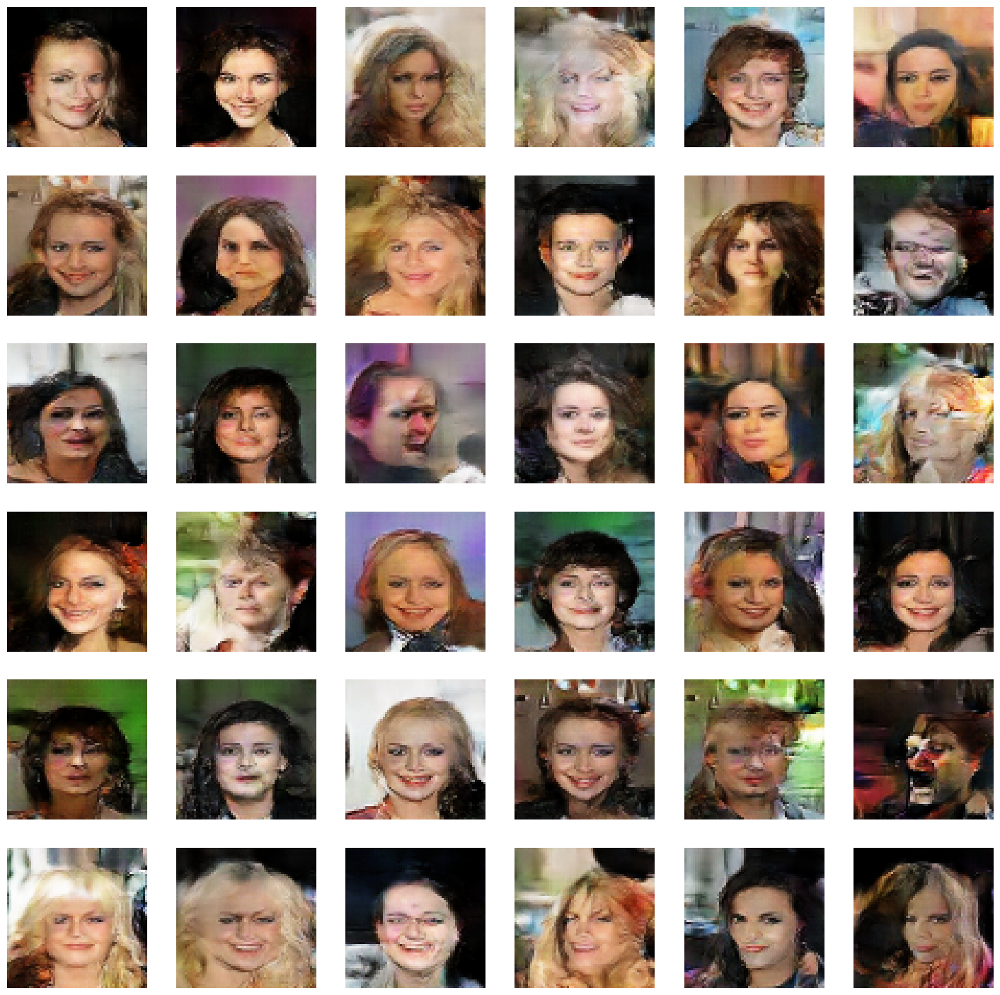

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 309s 49ms/step - d_loss: 0.8295 - g_loss: 1.5232
Epoch 15/15
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - d_loss: 0.8031 - g_loss: 1.5700

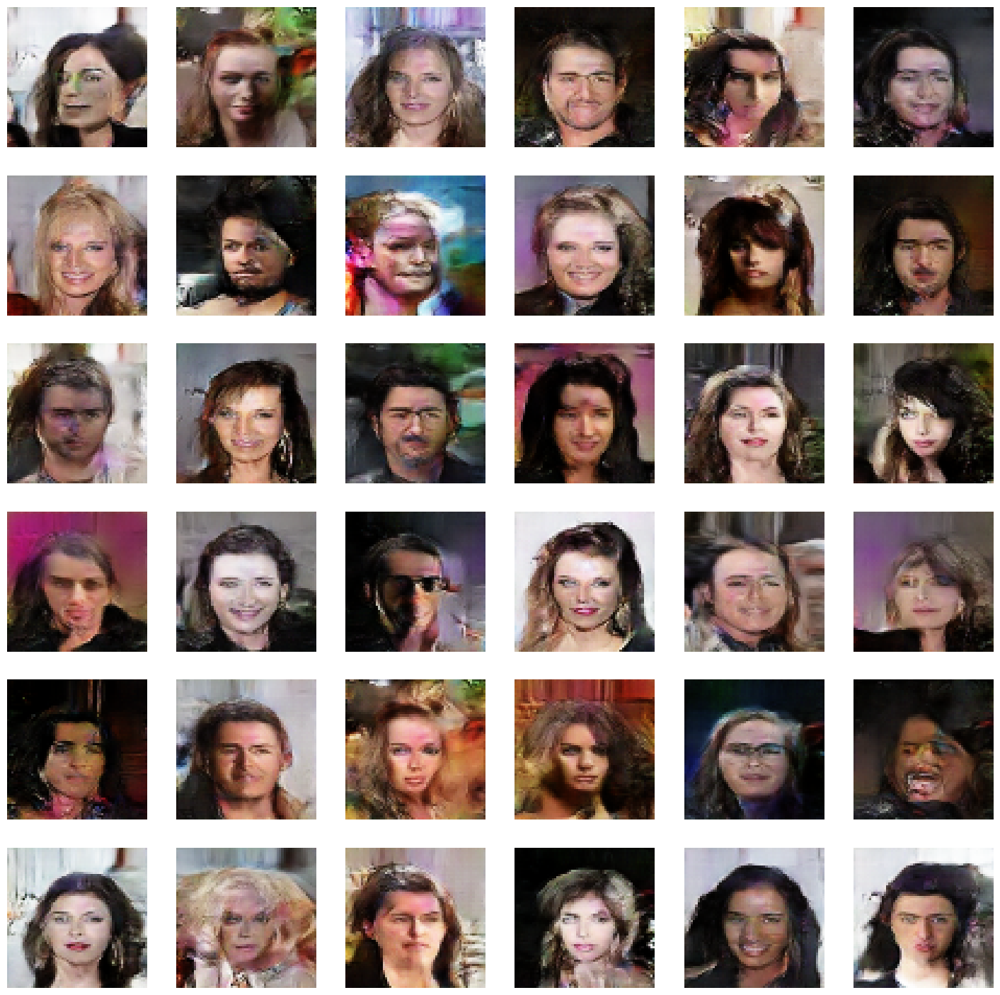

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 324s 49ms/step - d_loss: 0.8031 - g_loss: 1.5700


In [21]:
history = gan.fit(train_dataset, epochs=EPOCHS, verbose=1, callbacks=[ShowImage(LATENT_DIM)])

In [23]:
from google.colab import files
files.download('/content/generated')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
generator.save('generator_model.keras')

In [47]:
from google.colab import files
files.download('/content/generator_model.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [46]:
discriminator.save('discriminator_model.keras')

In [48]:
from google.colab import files
files.download('/content/discriminator_model.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [49]:
generator = load_model('generator_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


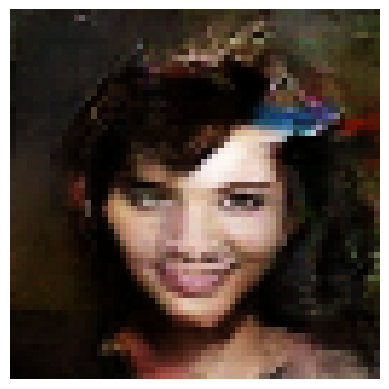

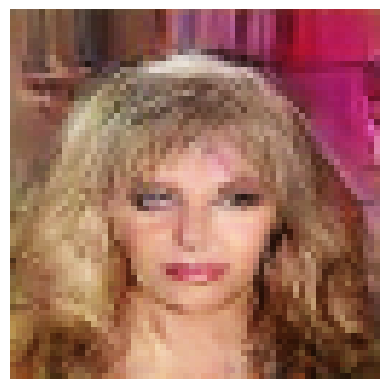

In [54]:
import numpy as np
import matplotlib.pyplot as plt

LATENT_DIM = 100
num_images = 2
noise = np.random.normal(size=(num_images, LATENT_DIM))

generated_images = generator.predict(noise)

generated_images = (generated_images + 1) / 2

for i in range(num_images):
    plt.imshow(generated_images[i])
    plt.axis('off')
    plt.show()